## Visualize WoFCast Predictions

In [1]:
import sys, os 
sys.path.insert(0, os.path.dirname(os.path.dirname(os.getcwd())))

from wofscast.model import WoFSCastModel
from wofscast.border_mask import BORDER_MASK_NUMPY

from wofscast.data_generator import (load_chunk, 
                                     WRFZarrFileProcessor,
                                     WoFSDataProcessor, 
                                     dataset_to_input,
                                     add_local_solar_time
                                    )
from wofscast import checkpoint
from wofscast.wofscast_task_config import (DBZ_TASK_CONFIG, 
                                           WOFS_TASK_CONFIG, 
                                           DBZ_TASK_CONFIG_1HR,
                                           DBZ_TASK_CONFIG_FULL
                                          )


from wofscast.diffusion import EDMPrecond
from diffusers import UNet2DModel

In [2]:
# For plotting. 
import os
import numpy as np
import xarray 
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable

from wofscast.plot import WoFSColors, WoFSLevels
from datetime import datetime
import pandas as pd
import xarray as xr

def get_case_date(path):
    name = os.path.basename(path)
    comps = name.split('_')
    
    start_date = comps[1]+'_'+comps[2]
    start_date_dt = datetime.strptime(start_date, '%Y-%m-%d_%H%M%S')
    
    if start_date_dt.hour < 14:
        case_date = start_date_dt.date() - timedelta(days=1)
    else:
        case_date = start_date_dt.date() 
        
    return case_date.strftime('%Y%m%d')
    

def to_datetimes(path, n_times = 13):  
    name, freq, ens_mem = os.path.basename(path).split('__')
    start_time_dt = datetime.strptime(name.split('_to')[0], 'wrfwof_%Y-%m-%d_%H%M%S')
    start_time = pd.Timestamp(start_time_dt)
    
    dt_list = pd.date_range(start=start_time, periods=n_times, freq=freq)
    return dt_list[2:]

# Assuming 'BORDER_MASK' is available and correctly sized for your 'preds' and 'tars'
def border_difference_check(preds, tars, border_mask):
    """Calculate the difference at the border and return a mask of differences."""
    border_diff = np.abs(preds - tars)
    # Apply the border mask to get differences only at the border
    border_diff_masked = np.where(border_mask, border_diff, np.nan)  # NaN where not border
    return np.nanmax(border_diff_masked)  # Get the maximum difference at the border

display_name_mapper = {'U' : 'U-wind Comp.', 
          'V' : 'V-wind Comp.', 
          'W' : 'Vert. Velocity',
          'T' : 'Pot. Temp.', 
          'GEOPOT' : 'Geopot. Height',
          'QVAPOR' : 'QVAPOR', 
          'T2' : '2-m Temp.', 
          'COMPOSITE_REFL_10CM' : 'Comp. Refl. > 40 dBZ',
          'COMPOSITE_REFL_10CM_nmep' : 'Comp. Refl. > 40 dBZ',             
          'UP_HELI_MAX' : '2-5 km UH', 
          'RAIN_AMOUNT' : 'Rain Rate'
         }

units_mapper = {'T': 'K', 
                'QVAPOR': 'kg/kg', 
                'T2': 'F', 
                'U': 'm/s', 
                'V': 'm/s', 
                'W': 'm/s', 
                'GEOPOT': 'm', 
                'RAIN_AMOUNT': 'in', 
                'COMPOSITE_REFL_10CM': 'dBZ'
               }

## Predict with WoFS-Cast

In [3]:
from glob import glob
# Get the paths to all the ensemble members. 
base_path = '/work/mflora/wofs-cast-data/datasets_2hr_zarr/2021'

# The case Corey keeps animating. 
name = 'wrfwof_2021-05-15_000000_to_2021-05-15_021000__10min__ens_mem_09.zarr'
#name = 'wrfwof_2021-05-12_220000_to_2021-05-13_001000__10min__ens_mem_08.zarr'
#name = 'wrfwof_2021-05-07_210000_to_2021-05-07_231000__10min__ens_mem_09.zarr'



#base_path = '/work2/mflora/wofscast_datasets/dataset_10min_15min_init/2021'
#name = 'wrfwof_2021-05-14_231500_to_2021-05-15_012500__10min__ens_mem_09.zarr'

path = os.path.join(base_path, name)

ens_paths = glob(f"{path.split('ens_mem')[0]}*")
ens_paths.sort()

In [4]:
from wofscast.normalization import normalize, unnormalize 

class PyTorchScaler:
    def __init__(self, mean, std, diff_std):
        self.mean = mean 
        self.std = std 
        self.diff_std = diff_std

    def scale(self, x):
        return normalize(x, self.std, self.mean)

    def unscale(self, x): 
        return unnormalize(x, self.std, self.mean)
    
    def unscale_residuals(self, x):
        return unnormalize(x, self.diff_std, None)


norm_stats_path = '/work/mflora/wofs-cast-data/full_normalization_stats'
mean_by_level = xarray.load_dataset(os.path.join(norm_stats_path, 'mean_by_level.nc'))
stddev_by_level = xarray.load_dataset(os.path.join(norm_stats_path, 'stddev_by_level.nc'))
diffs_stddev_by_level = xarray.load_dataset(os.path.join(norm_stats_path, 'diffs_stddev_by_level.nc'))

scaler = PyTorchScaler(mean_by_level, stddev_by_level, diffs_stddev_by_level)

In [16]:
steps_per_hour = 6 # 60 min / 10 min time steps
hours = 6
n_steps = steps_per_hour * hours 
dts = to_datetimes(path, n_times = n_steps+2)

In [6]:
%%time 
MODEL_PATH = '/work/cpotvin/WOFSCAST/model/wofscast_test_v178.npz'
#MODEL_PATH = '/work/cpotvin/WOFSCAST/model/wofscast_test_v203.npz'

model = WoFSCastModel()
 
model.load_model(MODEL_PATH)

#wrap diffusers/pytorch model 
domain_size = 160
diffusion_model_path = "/work/mflora/wofs-cast-data/diffusion_models/diffusion_refl_only_v7"

diffusion_model = UNet2DModel.from_pretrained(diffusion_model_path).to('cuda')
model_wrapped = EDMPrecond(domain_size, 1, diffusion_model)

#model_wrapped = None

dataset = load_chunk(ens_paths, len(ens_paths), add_local_solar_time)
dataset = dataset.compute() 

inputs, targets, forcings = dataset_to_input(dataset, model.task_config, 
                                             target_lead_times=slice('10min', '120min'), 
                                             batch_over_time=False, n_target_steps=12)

sampler_kwargs = dict(
    sigma_min = 0.0002,
    sigma_max =100000, 
    S_churn=np.sqrt(2)-1, 
    S_min=0.02, 
    S_max=1000, 
    S_noise=1.5) 


predictions = model.predict(inputs, 
                            targets, 
                            forcings, 
                            initial_datetime=dts[0], 
                            n_steps=n_steps
                            #scaler=scaler, 
                            #n_diffusion_steps=20,
                            #diffusion_model=model_wrapped,
                            #sampler_kwargs=sampler_kwargs,
                            #variables = ['COMPOSITE_REFL_10CM'],
                           )

/work/mflora/miniconda3/envs/wofs-cast-gen/lib/python3.10/site-packages/diffusers/models/lora.py:387: FutureWarning: `LoRACompatibleLinear` is deprecated and will be removed in version 1.0.0. Use of `LoRACompatibleLinear` is deprecated. Please switch to PEFT backend by installing PEFT: `pip install peft`.
  deprecate("LoRACompatibleLinear", "1.0.0", deprecation_message)
/work/mflora/miniconda3/envs/wofs-cast-gen/lib/python3.10/site-packages/diffusers/models/lora.py:300: FutureWarning: `LoRACompatibleConv` is deprecated and will be removed in version 1.0.0. Use of `LoRACompatibleConv` is deprecated. Please switch to PEFT backend by installing PEFT: `pip install peft`.
  deprecate("LoRACompatibleConv", "1.0.0", deprecation_message)


If using n_steps, then replace_bdry must be False. Setting it to False.
Frozen({'lat': 150, 'level': 17, 'lon': 150, 'time': 36, 'batch': 18})
Frozen({'batch': 18, 'time': 36, 'lon': 150, 'lat': 150})
CPU times: user 57.1 s, sys: 25.2 s, total: 1min 22s
Wall time: 46.8 s


### Evaluate rainfall

In [20]:
class WoFSCastAnimator:
    def __init__(self, domain_size, plot_border=False, dts=None):
        self.dts = dts  # Placeholder, replace with your datetime conversion function
        self.plot_border = plot_border
        self.domain_size = domain_size
    
    def __call__(self, var, level, inputs, predictions, targets, ens_idx=0, mrms_dz=None, add_rmse=True):
        self.var = var
        self.level = level
        self.inputs = inputs
        #self.predictions = predictions
        #self.targets = targets
        self.mrms_dz = mrms_dz
        self.add_rmse=add_rmse
    
        init_ds, predictions, targets = self.drop_batch_dim(inputs, predictions, targets, ens_idx)
    
        self.predictions = predictions
        self.targets = targets
    
    
        level_txt = ''
        if level != 'none': 
            level_txt = f', level={level}'
    
        self.titles = [f'WoFS {display_name_mapper.get(var, var)}{level_txt}', 
                       f'WoFS-Cast {display_name_mapper.get(var, var)}{level_txt}']
    
        fig, self.axes = plt.subplots(dpi=200, figsize=(12, 6), ncols=2, 
                                      gridspec_kw={'height_ratios': [1], 'bottom': 0.15})
        
        plt.tight_layout()
    
        zs, levels = self.get_target_and_pred_pair(init_ds, init_ds, t=0, level=level, return_rng=True)
    
        self.cmap, self.levels = self.get_colormap_and_levels(var, levels)
    
        self.cbar_ax = fig.add_axes([0.15, 0.075, 0.7, 0.02])
        self.cbar = None
        
        self.fig = fig
        self.N = len(predictions.time)
    
        return FuncAnimation(fig, self.update, frames=self.N, interval=200)
    
    def drop_batch_dim(self, inputs, predictions, targets, batch_idx):
        dims = ('time', 'level', 'lat', 'lon')
        
        init_ds = inputs.isel(time=[-1], batch=batch_idx).transpose(*dims, missing_dims='ignore')
        preds = predictions.isel(batch=batch_idx).transpose(*dims, missing_dims='ignore')
        tars = targets.isel(batch=batch_idx).transpose(*dims, missing_dims='ignore')
    
        return init_ds, preds, tars
    
    def get_target_and_pred_pair(self, preds, targets, t, level=0, return_rng=False):
        max_t = len(targets.time) - 1
        target_t = max_t
        if t < max_t:
            target_t = t
        
        if level == 'max':
            zs = [targets[self.var].isel(time=target_t).max(dim='level').values, 
                  preds[self.var].isel(time=t).max(dim='level').values]
        elif level == 'min': 
            zs = [targets[self.var].isel(time=target_t).min(dim='level').values, 
                  preds[self.var].isel(time=t).min(dim='level').values]
        elif level == 'none':
            zs = [targets[self.var].isel(time=target_t).values, 
                  preds[self.var].isel(time=t).values]
        else:
            zs = [targets[self.var].isel(time=target_t, level=level).values, 
                  preds[self.var].isel(time=t, level=level).values]
    
        if self.var == 'RAIN_AMOUNT':
            zs = [z / 25.4 for z in zs]
    
        if self.var == 'T2':
            zs = [(9.0 / 5.0 * (z - 273.15)) + 32.0 for z in zs]
    
        if return_rng:
            global_min = np.percentile(zs, 1)
            global_max = np.percentile(zs, 99)
            rng = np.linspace(global_min, global_max, 10)
            return zs, rng
    
        return zs 
    
    def get_colormap_and_levels(self, var, levels):
        if var == 'COMPOSITE_REFL_10CM':
            cmap = WoFSColors.nws_dz_cmap
            levels = WoFSLevels.dz_levels_nws
        elif var == 'RAIN_AMOUNT':
            cmap = WoFSColors.rain_cmap
            levels = WoFSLevels.rain_rate_levels
        elif var == 'UP_HELI_MAX':
            cmap = WoFSColors.wz_cmap_extend
            levels = WoFSLevels.uh_2to5_levels_3000m
        elif var == 'T2':
            cmap = WoFSColors.temp_cmap
            levels = np.arange(40., 90., 2.5)
        elif var == 'QVAPOR': 
            cmap = WoFSColors.temp_cmap
        elif var == 'W': 
            cmap = WoFSColors.wz_cmap_extend
            levels = [2.5, 5, 10, 15, 20, 25, 30, 35, 40]
        elif 'nmep' in var:
            cmap = WoFSColors.wz_cmap
            levels = WoFSLevels.prob_levels
        else:
            cmap = WoFSColors.wz_cmap_extend
        
        return cmap, levels
    
    def update(self, t):
        for ax in self.axes:
            ax.clear()

        if t == 0:
            zs = self.get_target_and_pred_pair(self.inputs, self.inputs, t=0, level=self.level)
        else:    
            zs = self.get_target_and_pred_pair(self.predictions, self.targets, t=t, level=self.level)
    
        rmse = np.sqrt(np.mean((zs[0] - zs[1])**2))

        try:
            u_pred, v_pred = self.predictions['U'][t].isel(level=0).values, self.predictions['V'][t].isel(level=0).values
            u_tar, v_tar = self.targets['U'][t].isel(level=0).values, self.targets['V'][t].isel(level=0).values 
            u_pred = u_pred[::5, ::5]
            v_pred = v_pred[::5, ::5]
            u_tar = u_tar[::5, ::5]
            v_tar = v_tar[::5, ::5]
            wind_pred = (u_pred, v_pred)
            wind_tar = (u_tar, v_tar)
            winds = [wind_tar, wind_pred]
            x, y = np.meshgrid(np.arange(self.domain_size), np.arange(self.domain_size))
            x = x[::5, ::5]
            y = y[::5, ::5]
        except:
            winds = [None, None]
    
        for i, (ax, z, wind) in enumerate(zip(self.axes, zs, winds)):
            #ax.axis('off')
            
            z = z.squeeze() 
            
            if self.var in ['REFL_10CM', 'UP_HELI_MAX', 'COMPOSITE_REFL_10CM']:
                z = np.ma.masked_where(z < 1, z)

            im = ax.contourf(z, origin='lower', aspect='equal', cmap=self.cmap, levels=self.levels)
 
            try:
                u, v = wind
                #ax.quiver(x, y, u, v, alpha=0.5)
            except:
                pass

            ax.set_title(self.titles[i], fontweight='bold')
            if i == 1:
                dis_name = display_name_mapper.get(self.var, self.var)
                if self.add_rmse:
                    ax.annotate(f'RMSE of {dis_name} ({units_mapper.get(self.var, self.var)}): {rmse:.4f}', 
                            xy=(0.01, 0.95), xycoords='axes fraction', 
                            weight='bold', color='red', 
                            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

            ax.annotate(f'Time: {self.dts[t]}', xy=(0.01, 0.01), xycoords='axes fraction', 
                        weight='bold', color='red', fontsize=10, 
                        bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

            if self.cbar is None:
                self.cbar = self.fig.colorbar(im, cax=self.cbar_ax, orientation='horizontal')
                self.cbar.set_label(f'{display_name_mapper.get(self.var, self.var)} ({units_mapper.get(self.var, self.var)})')
                
                
            # Plot the MRMS overlays
            if self.mrms_dz is not None:
                this_rmse = np.sqrt(np.mean((z - self.mrms_dz[t])**2))
            
                ax.contour(self.mrms_dz[t], 
                         origin='lower', aspect='equal', 
                        colors=['black', 'blue'], 
                        levels=[35.0, 50.0], linewidths=[1.0, 1.5])
            
                dis_name = display_name_mapper.get(self.var, self.var)
                if self.add_rmse:
                    ax.annotate(f'RMSE with MRMS: {this_rmse:.4f}', 
                            xy=(0.01, 0.90), xycoords='axes fraction', 
                            weight='bold', color='k', 
                            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
                   


In [21]:
# Load MRMS 

from pathlib import Path 
class MRMSDataLoader: 
    
    MRMS_PATH = '/work/rt_obs/MRMS/RAD_AZS_MSH/'
    
    def __init__(self, case_date, datetime_rng):
        self.case_date = case_date
        self.datetime_rng = datetime_rng 

    def find_mrms_files(self):
        """
        When given a start and end date, this function will find any MRMS RAD 
        files between those time periods. It will check if the path exists. 
        """
        year = str(self.datetime_rng[0].year) 
        mrms_filenames = [date.strftime('wofs_MRMS_RAD_%Y%m%d_%H%M.nc') for date in self.datetime_rng]

        mrms_filepaths = [Path(self.MRMS_PATH).joinpath(year, self.case_date, f) 
                          if Path(self.MRMS_PATH).joinpath(year, self.case_date, f).is_file() else None
                          for f in mrms_filenames 
                 ]
       
        return mrms_filepaths 
    
    def resize(self, ds, n_lat=300, n_lon=300, domain_size=150):
        """Resize the domain"""
        start_lat, start_lon = (n_lat - domain_size) // 2, (n_lon - domain_size) // 2
        end_lat, end_lon = start_lat + domain_size, start_lon + domain_size
        
        # Subsetting the dataset to the central size x size grid
        ds_subset = ds.isel(lat=slice(start_lat, end_lat), lon=slice(start_lon, end_lon))
        
        return ds_subset
    
    def load(self):

        files = self.find_mrms_files()
        
        # Initialize an empty list to store the datasets with 'mesh_consv' variable
        data = np.zeros((len(files), 150, 150))

        # Load 'mesh_consv' variable from each file and append to the datasets list
        for t, file in enumerate(files):
            if file is not None: 
                ds = xr.open_dataset(file, drop_variables=['lat', 'lon'])
                
                # Resize the output to 150 x 150
                ds = self.resize(ds)
                
                data[t,:,:] = ds['dz_consv'].values
    
                ds.close()
        
        return data


In [22]:
from scipy.ndimage import maximum_filter

def apply_maximum_filter(data, size=3):
    """
    Apply scipy's maximum filter to 2D data.

    Parameters:
    - data: 2D numpy array
    - size: size of the filter

    Returns:
    - filtered_data: 2D numpy array with the maximum filter applied
    """
    return maximum_filter(data, size=size)


def compute_nmep(dataset, var, threshold, filter_size=3):
    """
    Compute the Neighborhood Ensemble Probability (NMEP) for a given variable over all time steps using xarray,
    apply a maximum filter, and then threshold the results.

    Parameters:
    - dataset: xarray.Dataset, the input dataset containing the ensemble data.
    - var: str, the variable name to compute NMEP for.
    - threshold: float, the threshold value to binarize the data.
    - filter_size: int, the size of the maximum filter to apply.

    Returns:
    - xarray.Dataset, the dataset with the computed NMEP added as a new variable for each time step.
    """
    # Apply the maximum filter to the data
    filtered_data = xr.apply_ufunc(
        apply_maximum_filter,
        dataset[var],
        input_core_dims=[['lat', 'lon']],
        output_core_dims=[['lat', 'lon']],
        vectorize=True,
        kwargs={'size': filter_size}
    )
    
    # Binarize the data based on the threshold
    data_binary = filtered_data >= threshold
    
    # Compute the probability (mean) across the ensemble dimension for each time step
    # Replace 'batch' with the actual ensemble dimension name
    probs = data_binary.mean(dim='batch')
    
    # Add the computed NMEP to the dataset as a new variable
    dataset[f'{var}_nmep'] = probs
    
    return dataset


In [23]:
predictions = compute_nmep(predictions, 'COMPOSITE_REFL_10CM', 40.0)
targets = compute_nmep(targets, 'COMPOSITE_REFL_10CM', 40.0)
inputs = compute_nmep(inputs, 'COMPOSITE_REFL_10CM', 40.0)

In [24]:
from datetime import timedelta

case_date = get_case_date(ens_paths[0])
loader = MRMSDataLoader(case_date, dts)
mrms_dz = loader.load() 

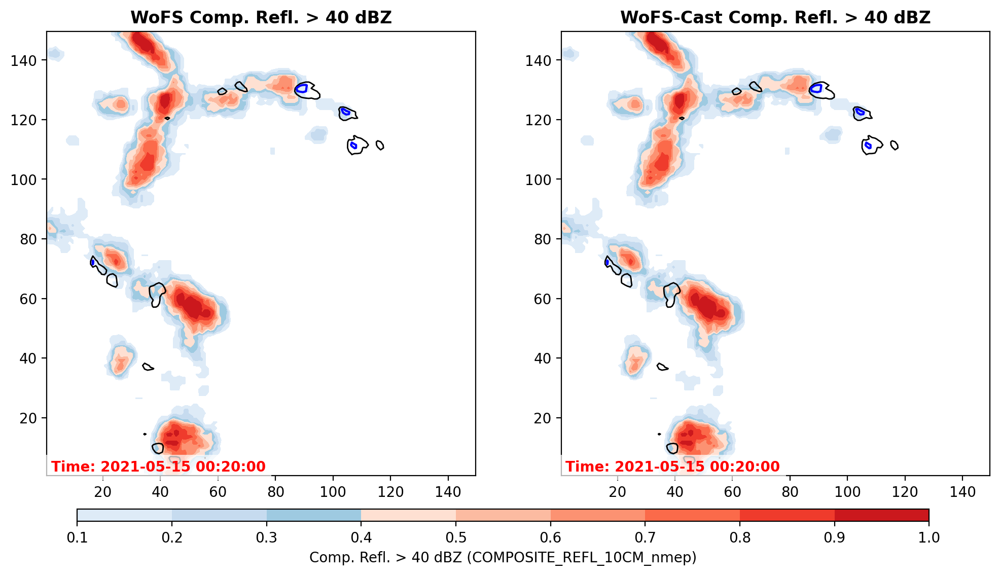

In [25]:
animator = WoFSCastAnimator(domain_size=150, dts=dts)
anim = animator(var='COMPOSITE_REFL_10CM_nmep', 
                level='none',
                inputs=inputs, 
                predictions=predictions, 
                targets=targets, 
                mrms_dz=mrms_dz, 
                add_rmse=False
               )

# To display the animation in a Jupyter notebook
from IPython.display import HTML
HTML(anim.to_jshtml())

# Optionally, to save the animation
#anim.save(f"gifs/wofscast_ens_probs_{case_date}.gif", writer="pillow", fps=3)   